## Quaternion Visualisation of Raw IMU Signals using `.svg` and `.pdf` Plots  
### *(Raw IMU data from VIDIMU)*  

This notebook visualises raw quaternion data collected from IMU sensors in the VIDIMU dataset and stored as _.raw_ files.  
It builds upon the original [VIDIMU GitHub repository](https://github.com/twyncoder/vidimu-tools),  
with added **documentation, explanations, and visual enhancements** for improved usability and understanding.


### What this notebook does:
- Visualises quaternion signals for each subject and activity.
- Outputs plots as `.svg` and `.pdf` for further use.
- Uses reusable plotting functions from `utils/plotUtilities.py`.

### Why it's useful:
- Helps understand the IMU sensor orientation behaviour per activity.
- Lays the foundation for signal cleaning and feature extraction in HAR pipelines.


In [9]:
# Import Required Libraries 
import os
import sys
import pandas as pd
import matplotlib.pyplot as plt

# Add project directory to path so custom modules in /utils can be imported
sys.path.append(os.path.dirname(os.getcwd()))

# Import custom plotting function for quaternion visualisation
from utils.plotUtilities import plotRawQuaternionsPerActivity


###  Set Dataset Path and Load Sample File

Begin by specifying the dataset root directory and defining input/output paths. A sample `.raw` file is then read into a pandas DataFrame for inspection.


In [10]:
# Set dataset root directory 
fulldatasetpath = r"D:\Machine Learning\Video_IMU data\Data\dataset"

In [11]:
# Define input and output paths 
inpath = os.path.join(fulldatasetpath, 'videoandimus')

outpath = os.path.join(fulldatasetpath, 'analysis', 'videoandimus', 'quats')

In [12]:
# Load one .raw file as a sample
file_path = os.path.join(inpath, "S41", "S41_A02_T01.raw")

# Read the .raw file as a CSV (skip header row and define column names)
df_raw = pd.read_csv(file_path, skiprows=1, names=["sensor", "w", "x", "y", "z", "timestamp"])

# Preview the first few rows
df_raw.head()

,sensor,w,x,y,z,timestamp
0,qsHIPS,0.6614,0.0004,-0.7495,-0.0301,1.663349e+09
1,qsRUL,0.3974,0.6232,-0.4924,0.4597,1.663349e+09
2,qsRLL,0.3972,0.5610,-0.5394,0.4863,1.663349e+09
3,qsLUL,0.4403,-0.6295,-0.4465,-0.4588,1.663349e+09
4,qsLLL,0.4643,-0.6137,-0.5117,-0.3820,1.663349e+09


Select activities

### Define Activities, Subjects, and Configuration Parameters

Group IMU activities into upper- and lower-body categories and define the available subject IDs. 
Below, configure which activities and components to plot and set the input file path.


In [13]:
# Define activity categories 
lower_activities = ["A01","A02","A03","A04"]
upper_activities = ["A05","A06","A07","A08","A09","A10","A11","A12","A13"]
dataset_activities = lower_activities + upper_activities


# Activity labels (for legend use)
activities_legend = ["walk_forward", "walk_backward", "walk_along","sit_to_stand",
"move_right_arm","move_left_arm","drink_right_arm","drink_left_arm", "assemble_both_arms","throw_both_arms",
"reachup_right_arm","reachup_left_arm","tear_both_arms"]

In [14]:
# Define available subject IDs 
subjects = ["S40","S41","S42",  "S44",  "S46","S47","S48","S49","S50",
            "S51","S52","S53","S54","S55","S56","S57"]

### Configuration for Sample Subject and Plotting


### Iterate Through Activities to Generate Subplots per IMU Sensor

For each selected activity:
- Select IMU sensors based on body region (lower or upper).
- Locate the corresponding `.raw` file.
- Load data and plot each sensor's quaternion components (`w`, `x`, `y`, `z`) over time.


In [ ]:
# === CONFIGURATION ===
base_path = r"D:\Machine Learning\Video_IMU data\Data\dataset\videoandimus"

subject = "S41"                            # Selected subject ID
activities = ["A01", "A03", "A07", "A13"]  # List of activities to visualise
components = ['x', 'y', 'z', 'w']          # Quaternion components to plot

Using file: S41_A01_T02.raw


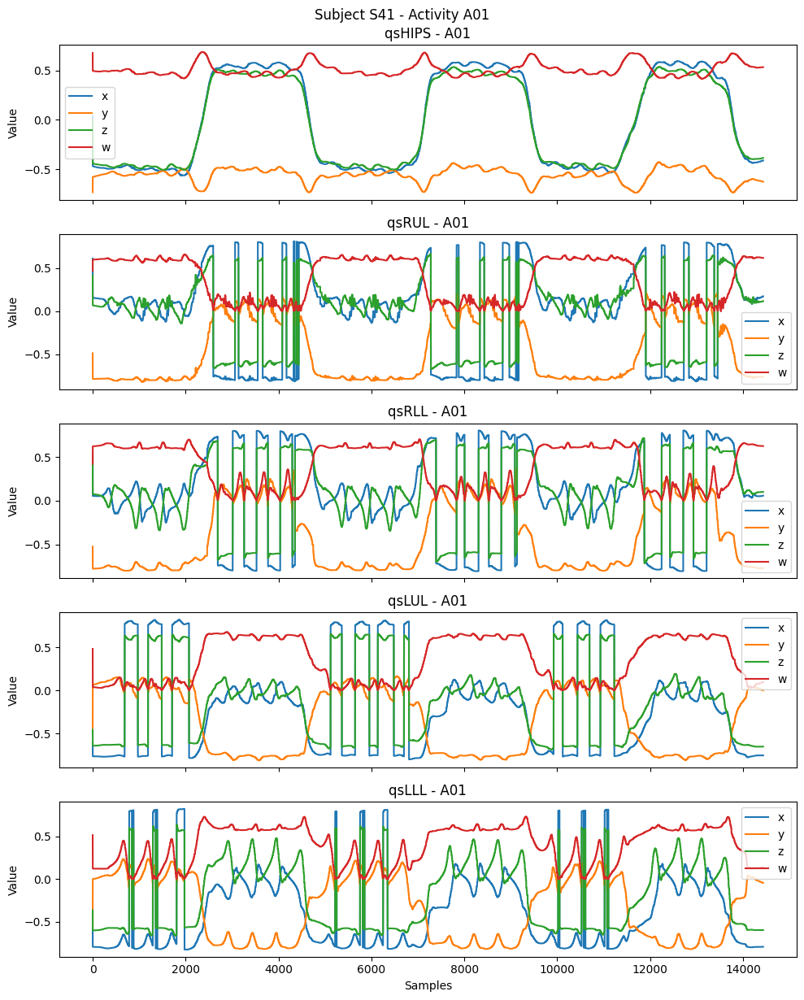

Using file: S41_A03_T01.raw


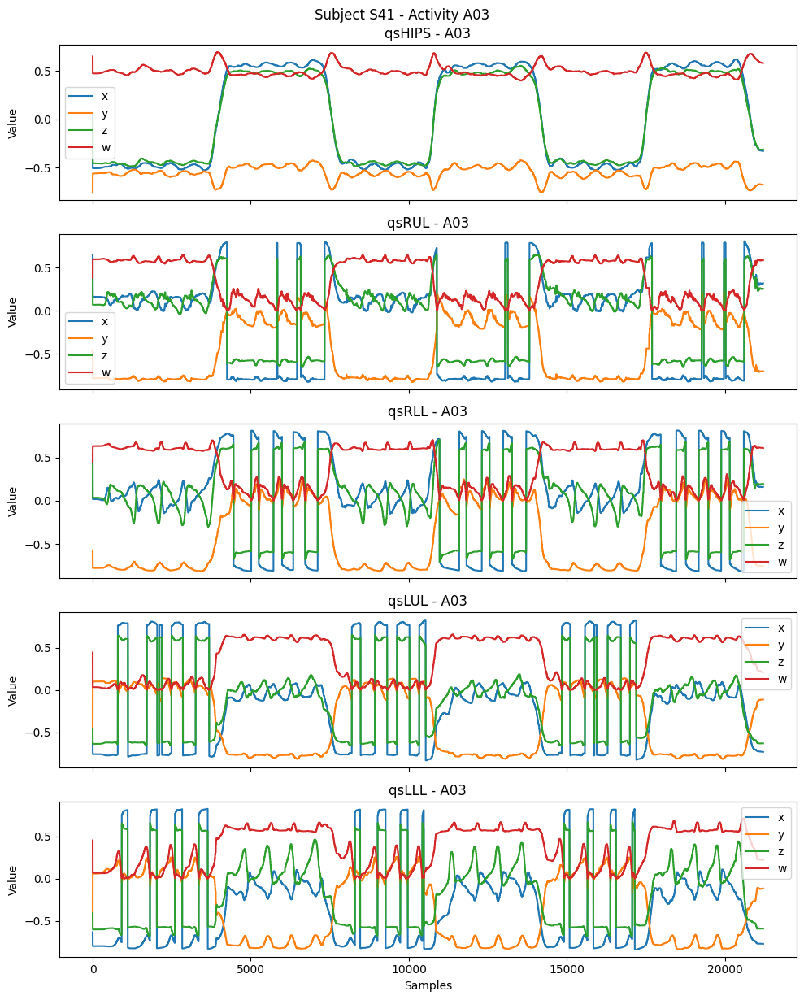

Using file: S41_A07_T01.raw


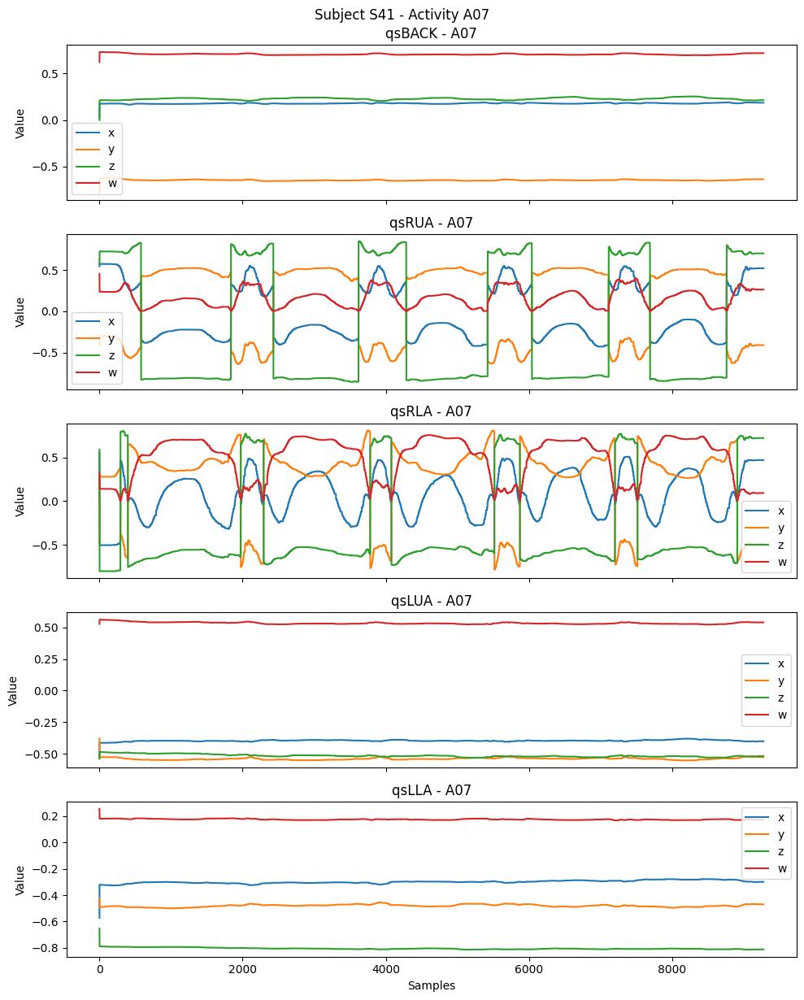

Using file: S41_A13_T02.raw


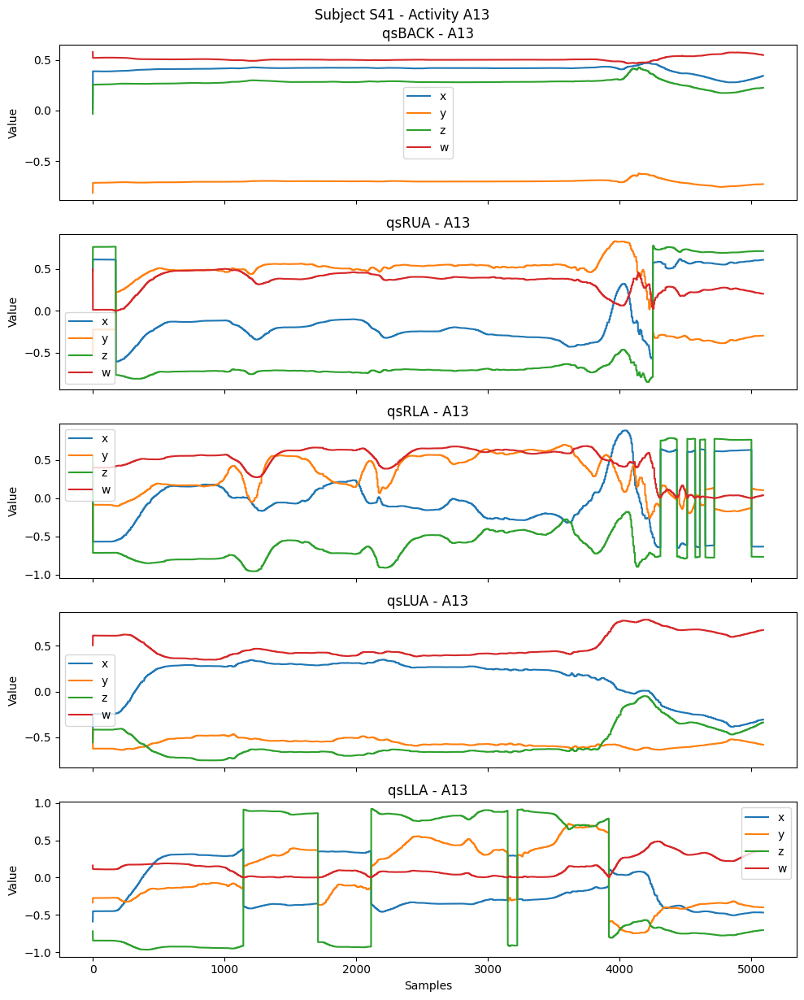

In [ ]:
# === PLOTTING LOOP ===
for activity in activities:
    # Select appropriate IMU sensors based on activity type
    if activity in ["A01", "A02", "A03", "A04"]:  # Lower-body activities
        imu_list = ['qsHIPS', 'qsRUL', 'qsRLL', 'qsLUL', 'qsLLL']
    else:  # Upper-body activities
        imu_list = ['qsBACK', 'qsRUA', 'qsRLA', 'qsLUA', 'qsLLA']

    # Define the folder path for the current subject
    subject_folder = os.path.join(base_path, subject)

    # Find matching raw data file for the subject-activity pair
    matching_files = [
        f for f in os.listdir(subject_folder)
        if f.startswith(f"{subject}_{activity}") and f.endswith(".raw")
    ]

    # Skip activity if no corresponding file is found
    if not matching_files:
        print(f"No file found for activity {activity}")
        continue

    # Construct full path to the matched file
    filename = matching_files[0]
    filepath = os.path.join(subject_folder, filename)

    print(f"Using file: {filename}")

    # Create subplot grid: one row per IMU sensor
    fig, axs = plt.subplots(
        len(imu_list), 1,
        figsize=(10, len(imu_list) * 2.5),
        sharex=True
    )

    try:
        # Read raw file into DataFrame
        df = pd.read_csv(
            filepath,
            skiprows=1,
            names=["sensor", "w", "x", "y", "z", "timestamp"]
        )

        # Plot each selected IMU's quaternion components
        for i, imu in enumerate(imu_list):
            df_imu = df[df['sensor'] == imu]

            if df_imu.empty:
                print(f"No data for {imu} in activity {activity}")
                continue

            for comp in components:
                axs[i].plot(df_imu[comp].values, label=comp)

            axs[i].set_title(f"{imu} - {activity}")
            axs[i].legend()
            axs[i].set_ylabel("Value")

        # Add shared x-label and layout adjustments
        plt.suptitle(f"Subject {subject} - Activity {activity}")
        plt.xlabel("Samples")
        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"Error reading {filepath}: {e}")


### From 'dataset/videandimus' to 'analysis/videoandimus/quats'

Activity A01


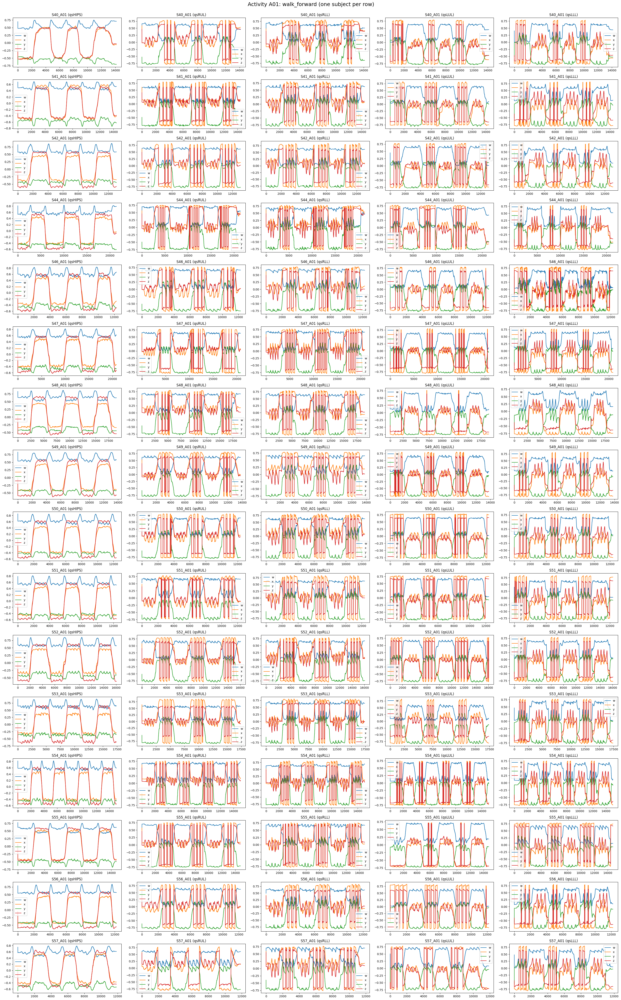

Activity A02


d:\Machine Learning\Video_IMU data\vidimu-tools\utils\plotUtilities.py:188: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig(os.path.join(outpath, outputfilename + ".svg"), format='svg')


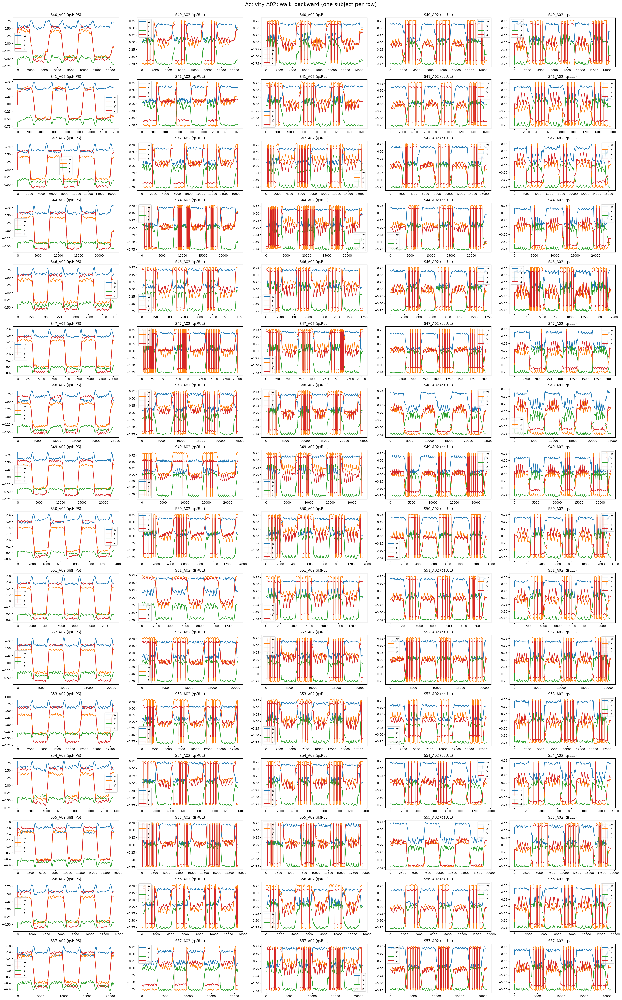

Activity A03


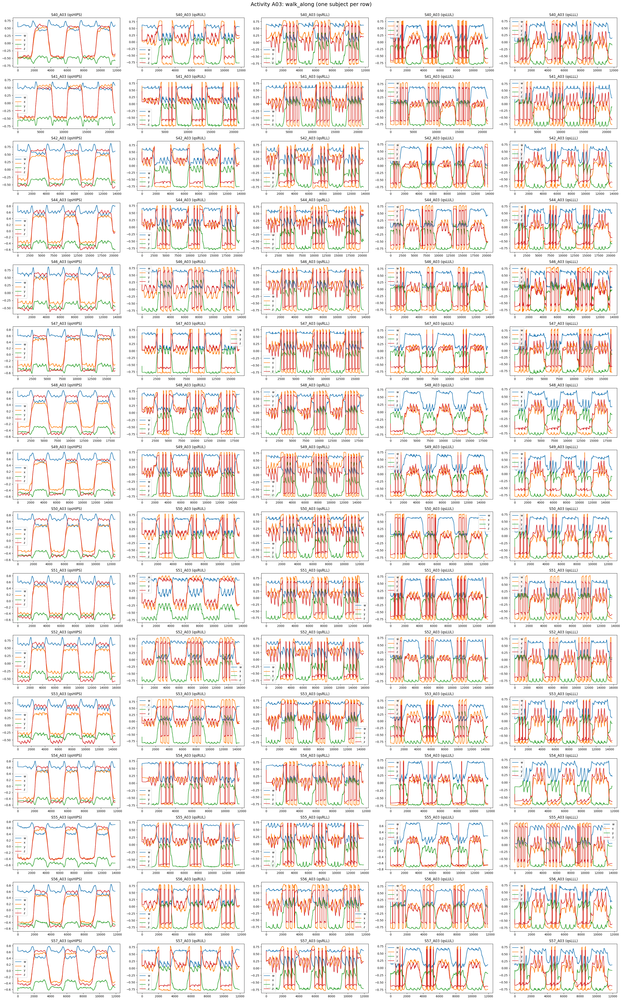

Activity A04


In [ ]:

# Create output directory if it doesn't exist
if not os.path.exists(outpath):
    os.makedirs(outpath)

# Loop through each activity and its corresponding legend label
for activity,legend in zip(dataset_activities,activities_legend):
    print("Activity "+activity)
    # Assign the correct list of IMUs based on whether it's a lower- or upper-body activity
    if activity in lower_activities:
        imu_list=['qsHIPS','qsRUL','qsRLL','qsLUL','qsLLL']
    elif activity in upper_activities:
        imu_list=['qsBACK','qsRUA','qsRLA','qsLUA','qsLLA']
        
    # Call the utility function to generate and save plots for the selected activity
    plotRawQuaternionsPerActivity(inpath,outpath,subjects,activity,legend,imu_list,'RawQuaternions_'+activity+'_'+legend)